In [1]:
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib.gridspec as gridspec
import seaborn as sns
#import plotly.graph_objs as go
from plotly.offline import init_notebook_mode,iplot
from mpl_toolkits import mplot3d
from scipy import stats
%matplotlib inline
import matplotlib.pyplot as plt
sns.set_theme()
# WordCloud
from wordcloud import WordCloud

# map visualization
import folium 
from folium import plugins

# preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
import pandas_profiling as pp

# models
from sklearn.linear_model import LinearRegression,LogisticRegression, SGDRegressor, RidgeCV
from sklearn.svm import SVR, LinearSVR
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import BaggingRegressor
import sklearn.model_selection
from sklearn.model_selection import cross_val_predict as cvp
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from scipy.stats import pearsonr

import xgboost as xgb
import lightgbm as lgb

# model tuning
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe, space_eval

import warnings
warnings.filterwarnings("ignore")


In [18]:
df=pd.read_csv('kc_house_data.csv')

In [19]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [20]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [21]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


preprocessing

In [ ]:
df.drop('id',axis=1, inplace=True)

In [ ]:
df.dtypes

date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [43]:
df.date= pd.to_datetime(df.date,errors='ignore')  

In [42]:
df['age']= 2022-df['yr_built']
df['age']=df['yr_built'].apply(lambda x:2022-x)

data viz

<AxesSubplot:>

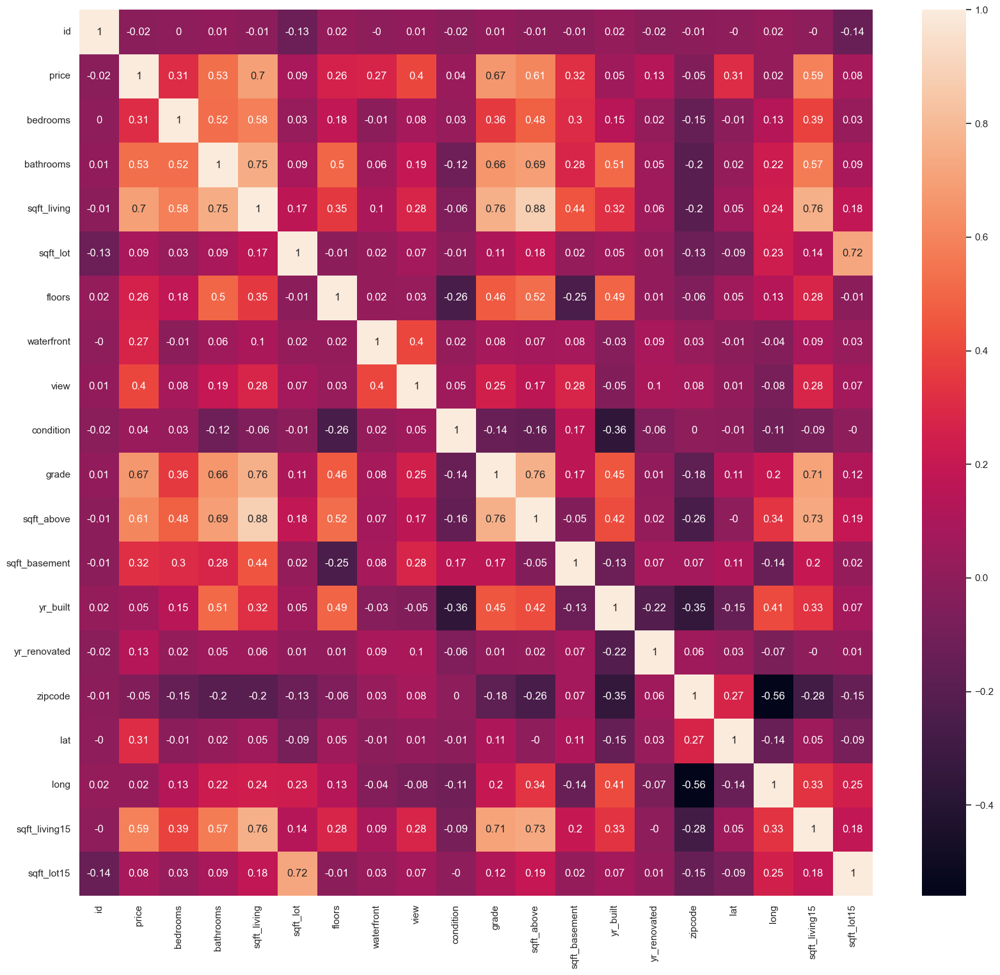

In [22]:
plt.figure(figsize=(20,18))
sns.heatmap(df.corr().round(2),annot=True)


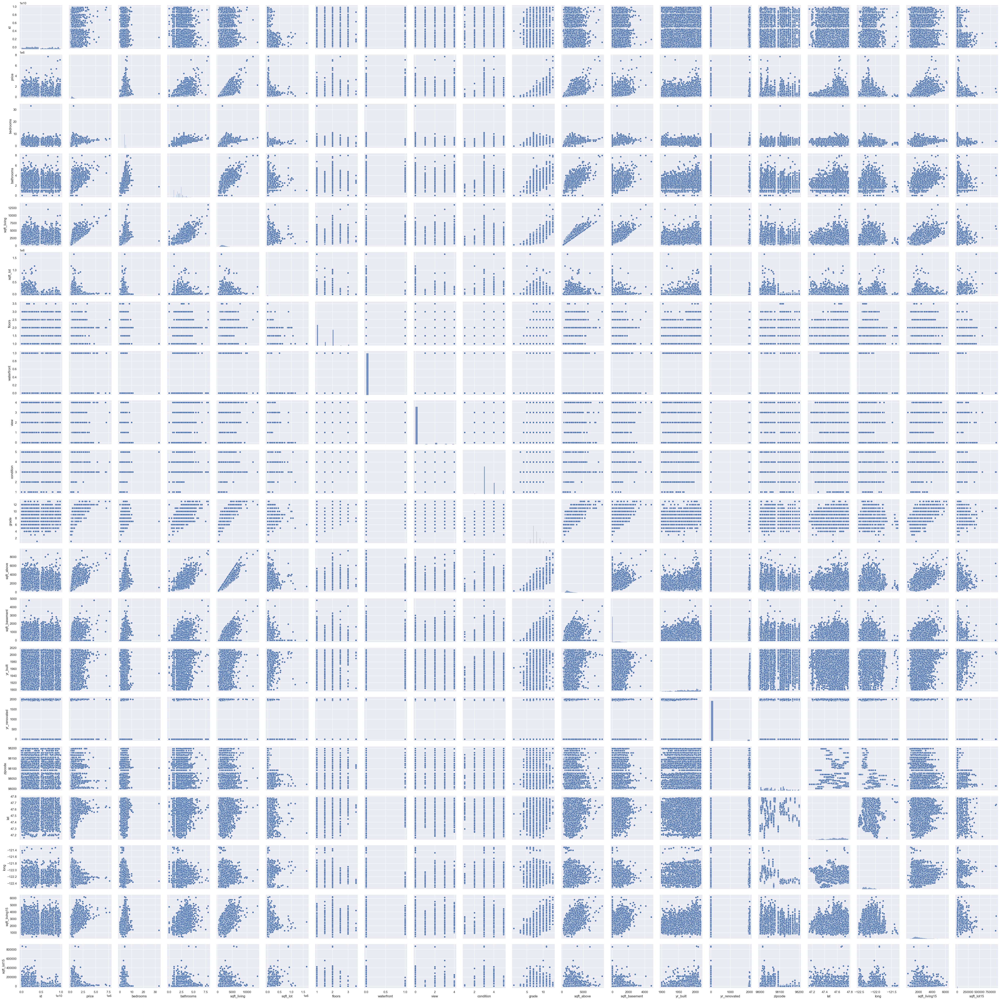

In [23]:
sns.pairplot(df)

forrr 

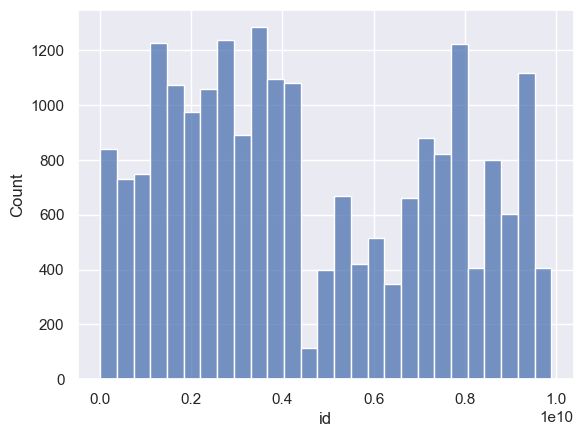

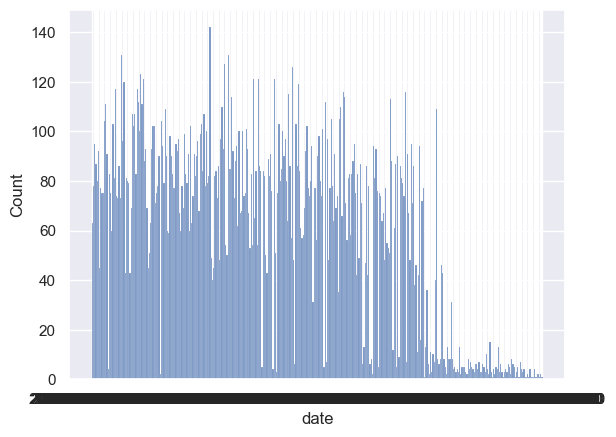

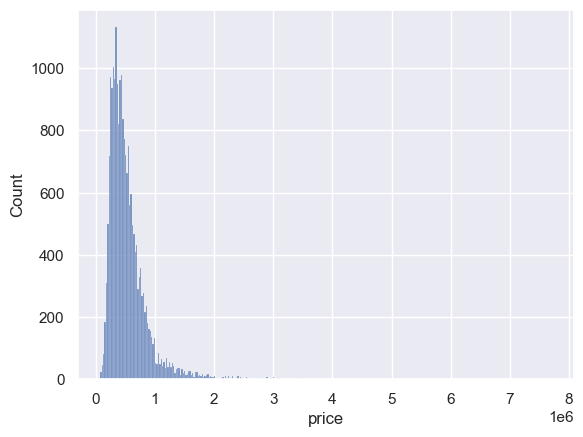

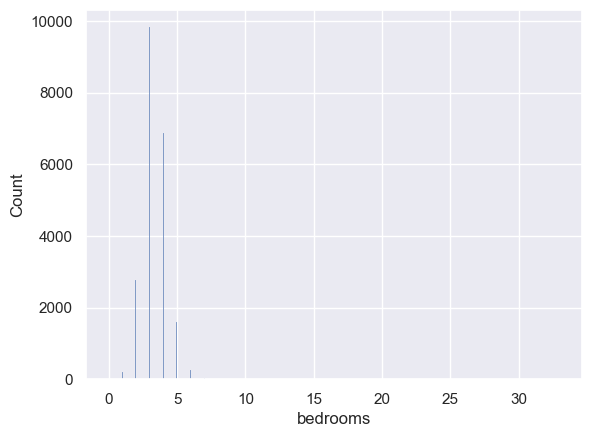

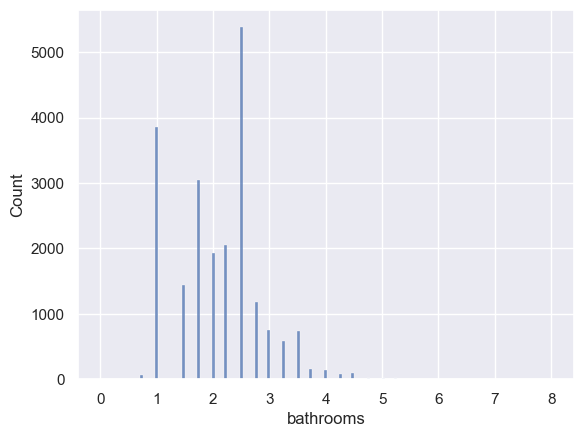

...

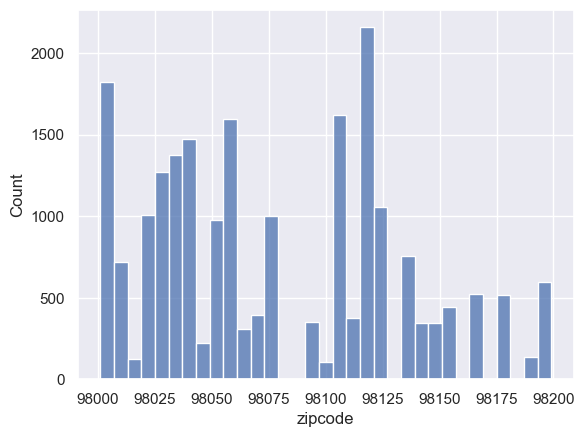

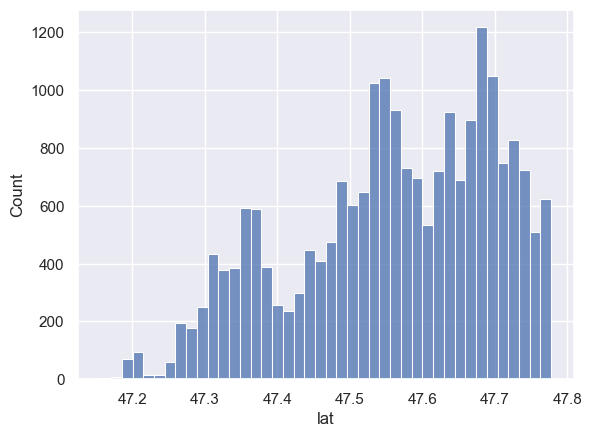

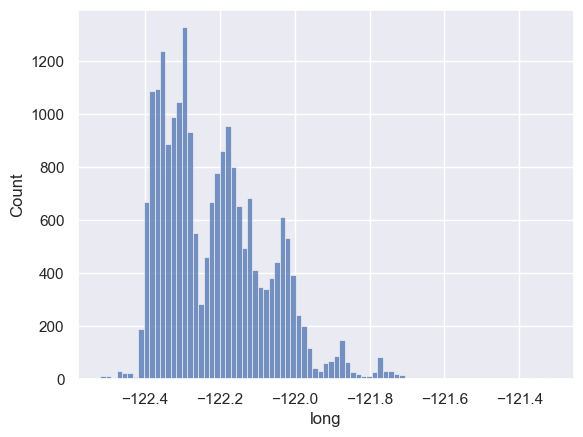

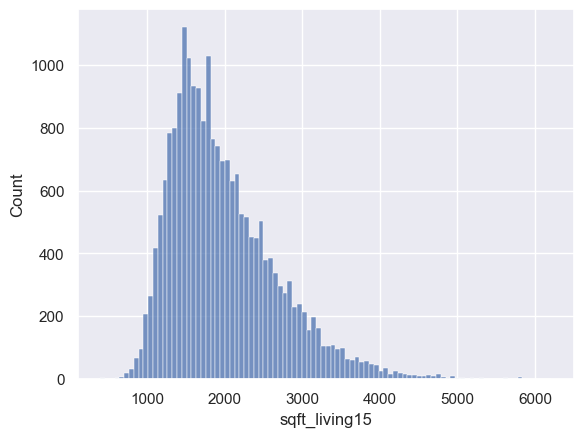

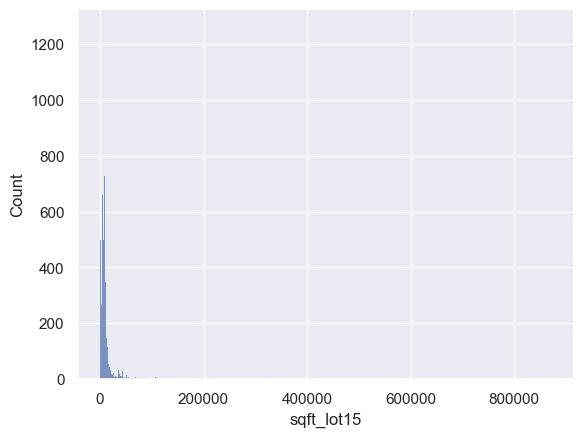

In [24]:
for i in df.columns:
    sns.histplot(df[i])
    plt.show()

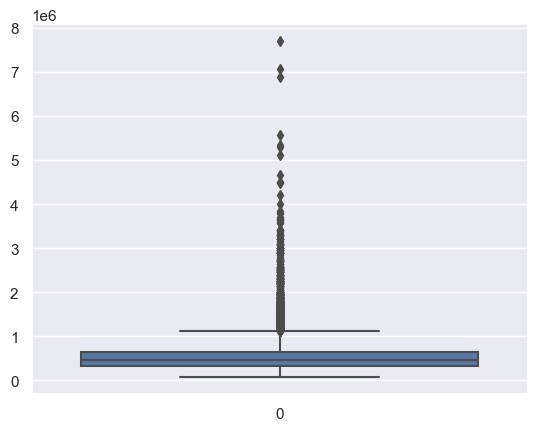

In [25]:
sns.boxplot(data=df['price']);

<AxesSubplot:>

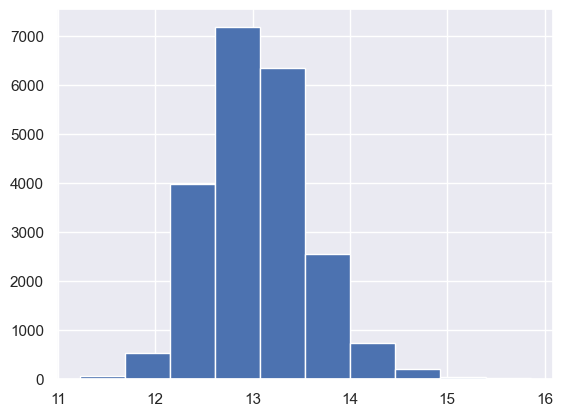

In [26]:
r=np.log(df['price'])
r.hist()

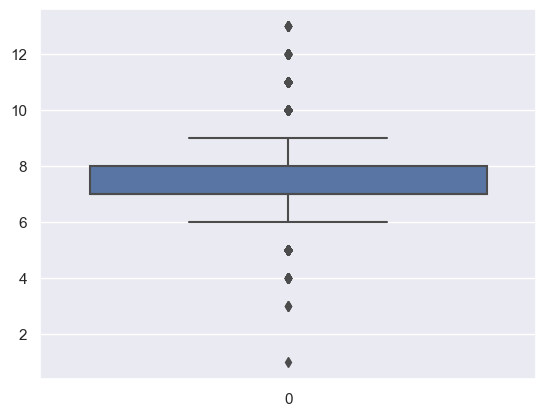

In [27]:
sns.boxplot(data=df['grade']);


plotly 

In [36]:
import plotly.express as px

In [37]:
px.box(df['price'])

In [38]:
px.histogram(df['price'])

In [40]:
px.density_heatmap(df['price'])

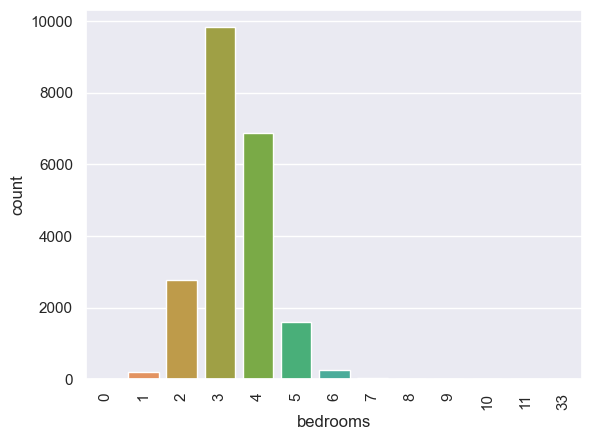

In [ ]:
sns.countplot(x=df['bedrooms'])
plt.xticks(rotation=90)
plt.show()

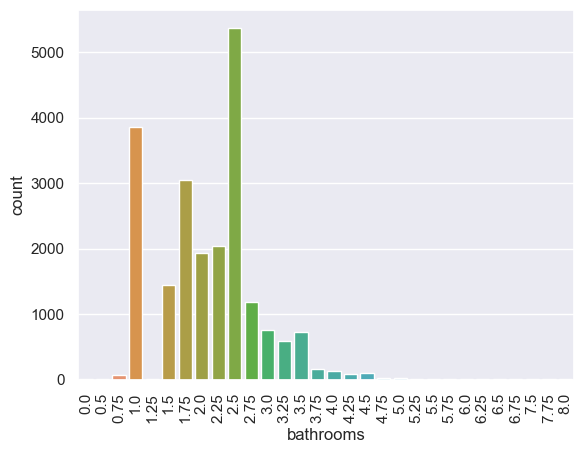

In [ ]:
sns.countplot(x=df['bathrooms'])
plt.xticks(rotation=90)
plt.show()

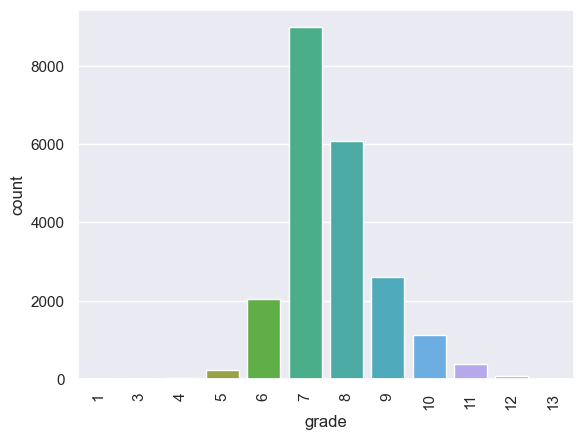

In [ ]:
sns.countplot(x=df['grade'])
plt.xticks(rotation=90)
plt.show()

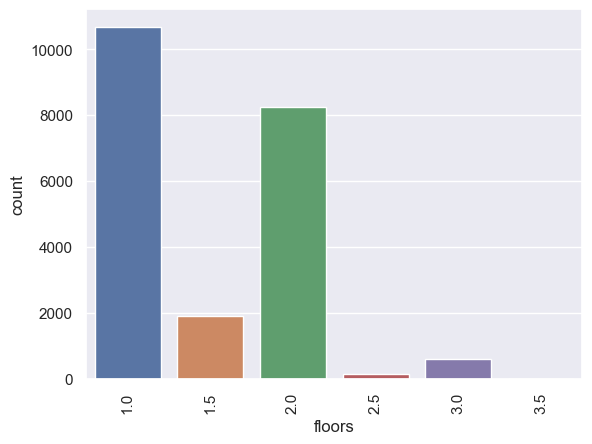

In [ ]:
sns.countplot(x=df['floors'])
plt.xticks(rotation=90)
plt.show()

In [ ]:
#for i in df.columns:
    #sns.countplot(x=df[i])

<AxesSubplot:xlabel='age', ylabel='price'>

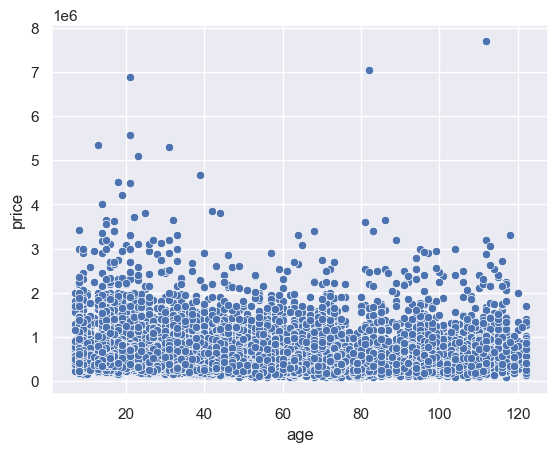

In [ ]:
sns.scatterplot(x=df['age'],y=df['price'])

one liner


In [ ]:
X=df['sqft_living']
y=df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,random_state=101)

shapeeee problemmm

In [ ]:
from sklearn.linear_model import LinearRegression
lr= LinearRegression()
lr.fit(X_train.array.reshape(-1, 1) ,y_train)
lr_predict=lr.predict(X_test.array.reshape(-1, 1))

In [ ]:
from sklearn.metrics import confusion_matrix , classification_report
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,lr_predict)

68728174522.82451

importttttant how to compare the predict and the actual

In [ ]:
##############################################################
pd.DataFrame({'actual':y_test,"predict":lr_predict})

,actual,predict
3834,349950.0,254127.533275
1348,450000.0,528860.979996
20366,635000.0,656514.904735
16617,355500.0,617663.710249
20925,246950.0,426182.823141
...,...,...
1398,465000.0,465034.017627
3364,418000.0,725892.037746
18958,394250.0,689815.928580
17845,249500.0,212501.253469


In [ ]:
X_train.array.reshape(-1, 1)

<PandasArray>
[
[1920],
[2620],
[1590],
[2540],
[3830],
[1170],
[1490],
[1540],
[1810],
[2220],
[910],
[2540],
[1840],
[3000],
[2930],
[2190],
[3220],
[2040],
[1350],
[1220],
[2100],
[1490],
[1270],
[2250],
[2840],
[910],
[1500],
[1690],
[1760],
[1080],
[2340],
[1290],
[2160],
[1920],
[1540],
[1830],
[2303],
[2400],
[2656],
[2070],
[1760],
[2170],
[2430],
[2340],
[3080],
[2020],
[2010],
[2710],
[1770],
[1380],
[2770],
[2320],
[1170],
[1010],
[1940],
[880],
[2380],
[3190],
[1640],
[2270],
[2960],
[1810],
[1640],
[1650],
[1300],
[1830],
[2440],
[1580],
[2570],
[4070],
[1110],
[1380],
[3160],
[2470],
[2240],
[2510],
[2460],
[2400],
[2330],
[1830],
[2160],
[2800],
[1260],
[1790],
[1420],
[1840],
[2000],
[1910],
[2050],
[2180],
[1410],
[1600],
[1970],
[1980],
[2180],
[3010],
[840],
[1790],
[3130],
[1610],
[3730],
[5640],
[820],
[2790],
[1640],
[1780],
[860],
[1810],
[2360],
[1060],
[1970],
[1370],
[2370],
[1510],
[2120],
[1720],
[2410],
[1500],
[1170],
[2050],
[1040],
[1650],
[3810],
[1960]

evalut the test

In [ ]:
from sklearn.metrics import confusion_matrix , classification_report
from sklearn.metrics import mean_squared_error ,mean_absolute_error
mean_squared_error(y_test,lr_predict)
mean_absolute_error(y_test,lr_predict)

172928.15705155348

In [ ]:
#sLOOPPP
lr.coef_

array([277.50853204])

In [ ]:
#CONCTANTTT
lr.intercept_

-37256.425368784345

In [ ]:
#score
lr.score(X_test.array.reshape(-1,1),y_test)

0.5100465327740269

#y*=bo+b1xi
# y*=277x-37256

### REGRATION MORE ONE VAR

In [ ]:
X=df.drop(['price','date'],axis=1)
y=df['price']

In [ ]:
X=df.drop(['price','date'],axis=1)

In [ ]:
X

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15,age
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,1340,5650,67
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,1690,7639,71
2,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,2720,8062,89
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,1360,5000,57
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,1800,7503,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,1530,1509,13
21609,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,1830,7200,8
21610,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,1020,2007,13
21611,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,1410,1287,18


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,random_state=101)
from sklearn.linear_model import LinearRegression
lr= LinearRegression()
lr.fit(X_train,y_train)
lr_predict=lr.predict(X_test)


In [ ]:
lr.coef_

array([-4.06367294e+04,  3.91411255e+04,  1.10156714e+02,  3.17271971e-02,
        3.09253823e+04,  5.45045027e+05,  4.27884230e+04,  2.14984534e+04,
        1.20671456e+05,  5.23796504e+01,  5.77770638e+01, -1.77067623e+03,
        1.08717422e+01,  2.42490340e+01, -5.50657549e-01,  1.77067623e+03])

In [ ]:
lr.intercept_

2553955.217533932

In [ ]:
lr.score(X_test,y_test)

0.6630883667183998

In [ ]:
pd.DataFrame({'actual':y_test,"predict":lr_predict})

,actual,predict
3834,349950.0,498971.979201
1348,450000.0,559504.122607
20366,635000.0,468990.932527
16617,355500.0,419907.218743
20925,246950.0,247140.167766
...,...,...
1398,465000.0,432171.792201
3364,418000.0,453699.512767
18958,394250.0,603975.279205
17845,249500.0,167202.760291


In [ ]:
mean_squared_error(y_test,lr_predict)
#mean_absolute_error(y_test,lr_predict)

47260246288.385025

In [ ]:
houses_map = folium.Map(location = [df['lat'].mean(), df['long'].mean()], zoom_start = 10)
lat_long_data = df[['lat', 'long']].values.tolist()
h_cluster = folium.plugins.FastMarkerCluster(lat_long_data).add_to(houses_map)
houses_map

In [ ]:
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode,iplot
from mpl_toolkits import mplot3d
from scipy import stats
%matplotlib inline

# WordCloud
from wordcloud import WordCloud

# map visualization
! pip install folium 
import folium 
from folium import plugins

# preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
import pandas_profiling as pp

# models
from sklearn.linear_model import LinearRegression,LogisticRegression, SGDRegressor, RidgeCV
from sklearn.svm import SVR, LinearSVR
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import BaggingRegressor
import sklearn.model_selection
from sklearn.model_selection import cross_val_predict as cvp
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from scipy.stats import pearsonr

import xgboost as xgb
import lightgbm as lgb

# model tuning
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe, space_eval

import warnings
warnings.filterwarnings("ignore")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
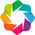

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


                                             |          | [  0%]   00:00 -> (? left)

In [45]:
import sweetviz as sv
#!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
report_alcohol = sv.analyze(df)

In [46]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()


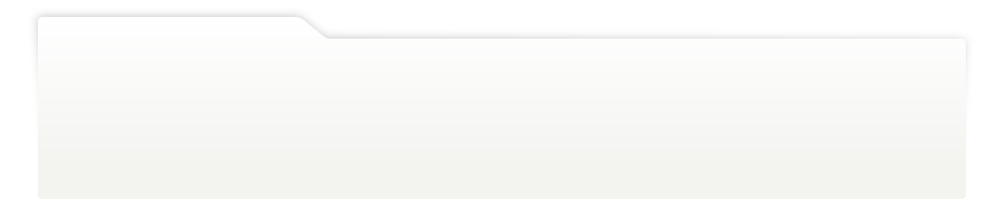
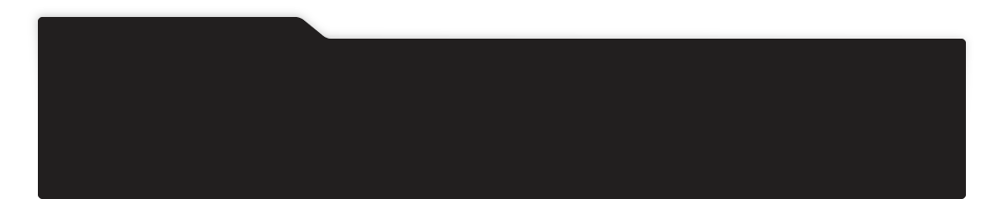
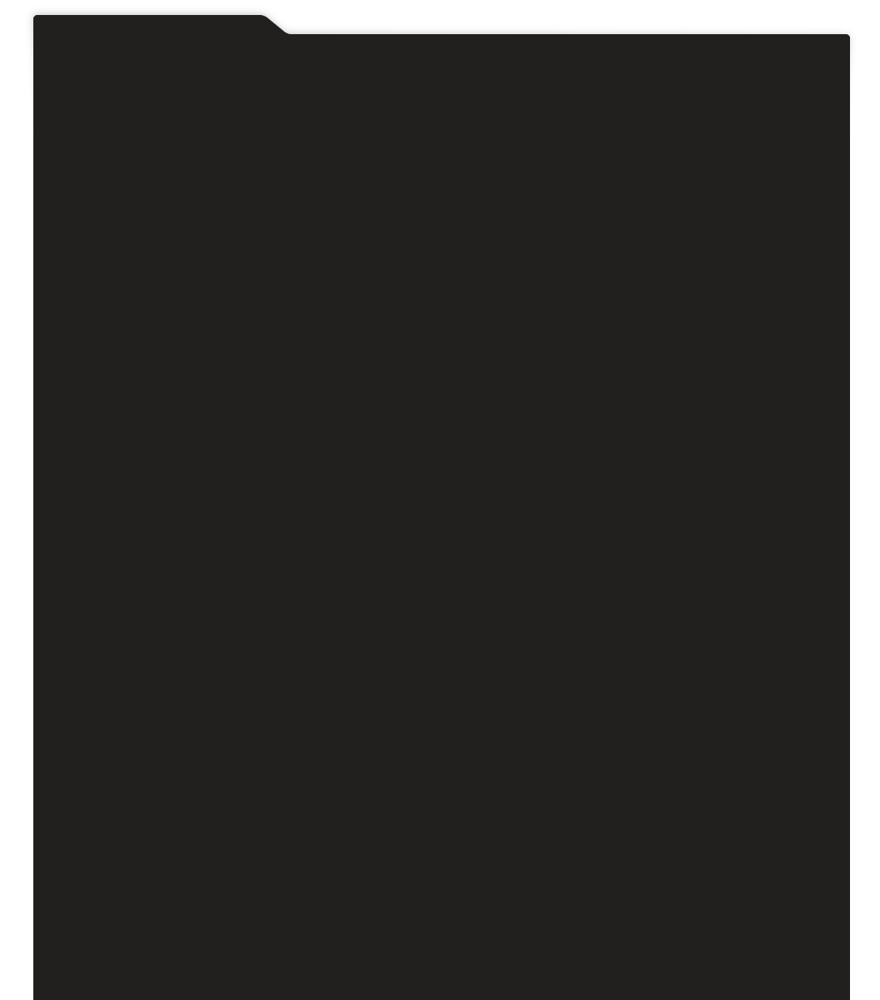
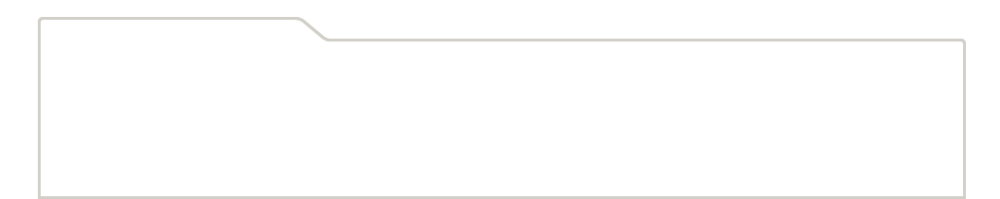
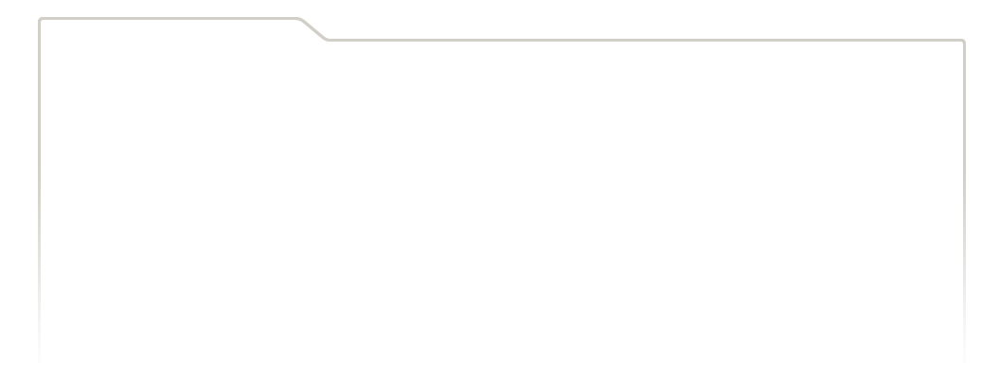
...
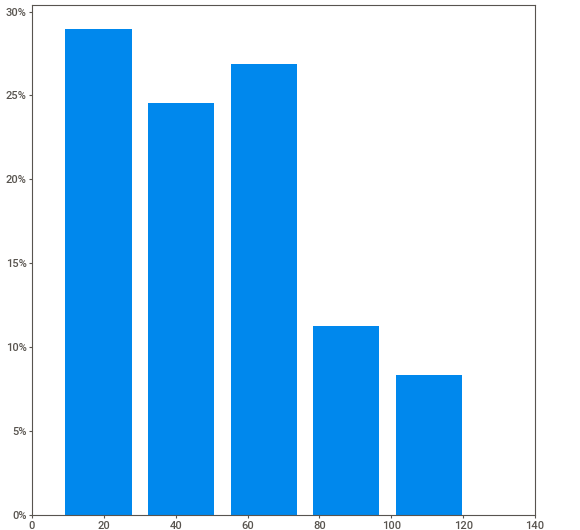
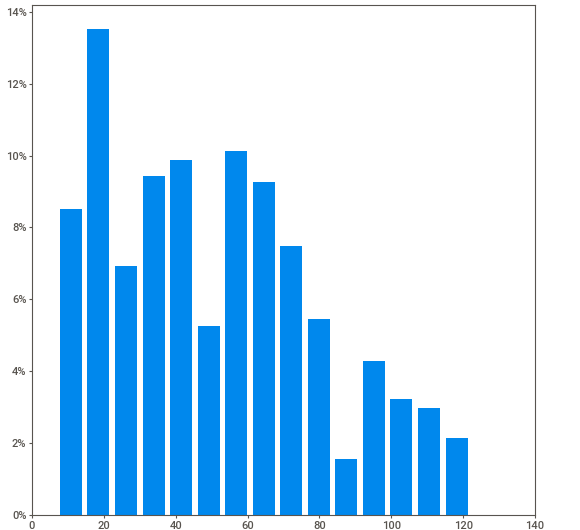
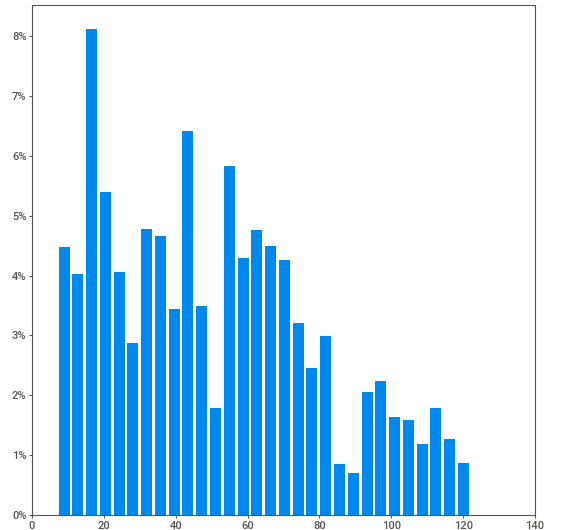
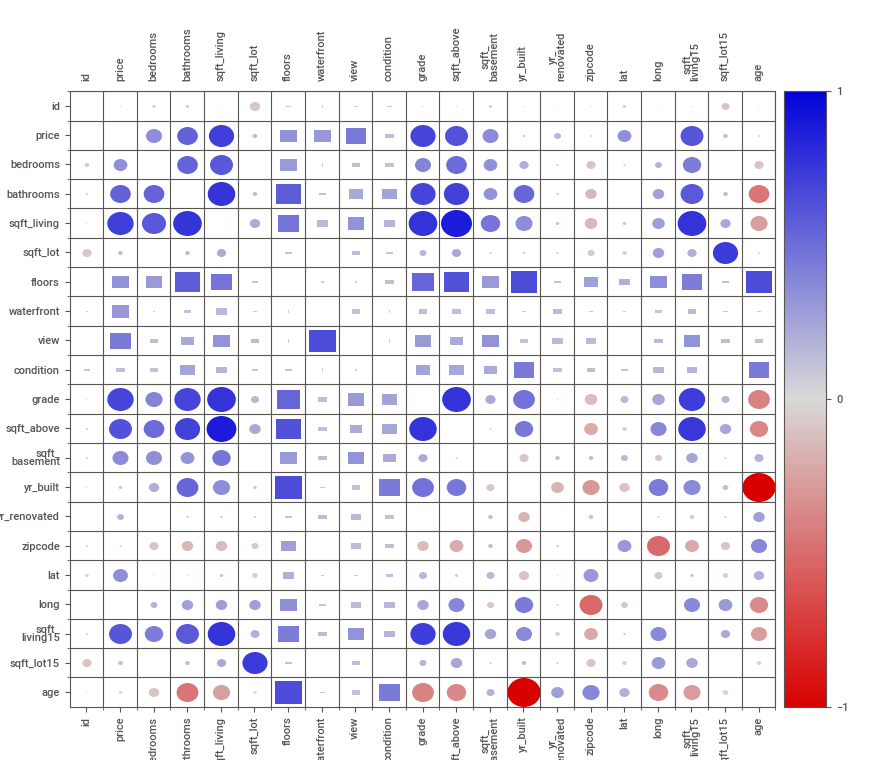
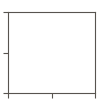

In [47]:
report_alcohol.show_notebook()

In [48]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
a = AV.AutoViz('kc_house_data.csv')

Shape of your Data Set loaded: (21613, 21)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
id,21436,int64,0,0.000000,99.181048,0,
sqft_lot,9782,int64,0,0.000000,45.259797,0,
sqft_lot15,8689,int64,0,0.000000,40.202656,0,
lat,5034,float64,0,0.000000,23.291538,0,
price,4028,float64,0,0.000000,18.636931,0,skewed: cap or drop outliers
sqft_living,1038,int64,0,0.000000,4.802665,0,
sqft_above,946,int64,0,0.000000,4.376995,0,
sqft_living15,777,int64,0,0.000000,3.595059,0,
long,752,float64,0,0.000000,3.479387,0,
date,372,object,0,0.000000,1.721186,1,combine rare categories


    21 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 15


[nltk_data] Error loading popular: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


All Plots done
Time to run AutoViz = 34 seconds 

 ###################### AUTO VISUALIZATION Completed ########################
